# Problem Statements

- Dataset Selection:
- For this assignment, we'll utilize the widely recognized Mushroom Dataset

- Task 1: Exploratory Data Analysis (EDA)
1.	Load the Mushroom dataset and perform fundamental data exploration.
2.	Utilize histograms, box plots, or density plots to understand feature distributions.
3.	Investigate feature correlations to discern relationships within the data.

- Task 2: Data Preprocessing
1.	Encode categorical variables if necessary.
2.	Split the dataset into training and testing sets.

- Task 3: Data Visualization
1.	Employ scatter plots, pair plots, or relevant visualizations to comprehend feature distributions and relationships.
2.	Visualize class distributions to gauge dataset balance or imbalance.

- Task 4: SVM Implementation
1.	Implement a basic SVM classifier using Python libraries like scikit-learn.
2.	Train the SVM model on the training data.
3.	Evaluate model performance on the testing data using appropriate metrics (e.g., accuracy, precision, recall, F1-score).

- Task 5: Visualization of SVM Results
1.	Visualize classification results on the testing data.

- Task 6: Parameter Tuning and Optimization
1.	Experiment with different SVM hyperparameters (e.g., kernel type, regularization parameter) to optimize performance.

- Task 7: Comparison and Analysis
1.	Compare SVM performance with various kernels (e.g., linear, polynomial, radial basis function).
2.	Analyze SVM strengths and weaknesses for the Mushroom dataset based on EDA and visualization results.
3.	Discuss practical implications of SVM in real-world classification tasks.


# Import Liabraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10,5)
plt.rcParams["figure.dpi"] = 300
sns.set_style('darkgrid')
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
%matplotlib inline
import warnings 
warnings.filterwarnings("ignore")

# Import Dataset

In [2]:
df = pd.read_csv("mushroom.csv")
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,...,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,...,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,...,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,...,universal,white,none,none,yellow,clustered,urban,poisonous,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,863,sunken,scaly,brown,yes,foul,attached,crowded,narrow,chocolate,...,partial,orange,one,flaring,purple,abundant,leaves,poisonous,5.877891,17.464145
1996,1160,sunken,scaly,purple,yes,musty,attached,distant,narrow,red,...,partial,white,one,zone,yellow,numerous,waste,poisonous,6.500840,13.501957
1997,265,convex,grooves,green,yes,fishy,notched,close,narrow,pink,...,partial,brown,two,evanescent,yellow,abundant,woods,poisonous,13.558064,11.270020
1998,411,bell,smooth,white,no,pungent,free,close,narrow,orange,...,universal,yellow,one,cobwebby,brown,solitary,woods,poisonous,11.092703,8.423199


# EDA (Exploratory Data Analysis)

- Exploratory Data Analysis (EDA) is an approach to analyze the data using visual techniques and statistical techniques. It is used to discover trends, patterns, or to check assumptions with the help of statistical summary and graphical representations.

**Steps involved in EDA**

- Describing the data
- Data cleaning
- Imputation techniques
- Data analysis and visualization
- Transformations
- Auto EDA

In [3]:
df.describe()

,Unnamed: 0,stalk_height,cap_diameter
count,2000.000000,2000.000000,2000.000000
mean,624.974000,8.449118,12.314345
std,375.091938,3.697217,7.048845
min,0.000000,2.000000,1.000000
25%,290.000000,5.291009,5.723521
50%,607.000000,8.318596,12.124902
75%,957.250000,11.781272,18.698605
max,1279.000000,15.095066,25.000054


In [4]:
df.describe(include = object)

,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,stalk_shape,...,stalk_color_above_ring,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class
count,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000,...,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000
unique,5,4,9,2,9,4,3,2,12,2,...,9,9,2,4,3,8,9,6,7,2
top,sunken,scaly,brown,yes,foul,free,distant,narrow,orange,enlarging,...,brown,orange,universal,white,one,sheathing,brown,abundant,urban,poisonous
freq,439,568,263,1023,274,540,677,1007,216,1040,...,271,259,1010,553,689,305,255,360,316,1400


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                2000 non-null   int64  
 1   cap_shape                 2000 non-null   object 
 2   cap_surface               2000 non-null   object 
 3   cap_color                 2000 non-null   object 
 4   bruises                   2000 non-null   object 
 5   odor                      2000 non-null   object 
 6   gill_attachment           2000 non-null   object 
 7   gill_spacing              2000 non-null   object 
 8   gill_size                 2000 non-null   object 
 9   gill_color                2000 non-null   object 
 10  stalk_shape               2000 non-null   object 
 11  stalk_root                2000 non-null   object 
 12  stalk_surface_above_ring  2000 non-null   object 
 13  stalk_surface_below_ring  2000 non-null   object 
 14  stalk_co

In [6]:
df.isnull().sum()

Unnamed: 0                  0
cap_shape                   0
cap_surface                 0
cap_color                   0
bruises                     0
odor                        0
gill_attachment             0
gill_spacing                0
gill_size                   0
gill_color                  0
stalk_shape                 0
stalk_root                  0
stalk_surface_above_ring    0
stalk_surface_below_ring    0
stalk_color_above_ring      0
stalk_color_below_ring      0
veil_type                   0
veil_color                  0
ring_number                 0
ring_type                   0
spore_print_color           0
population                  0
habitat                     0
class                       0
stalk_height                0
cap_diameter                0
dtype: int64

In [7]:
df.dtypes

Unnamed: 0                    int64
cap_shape                    object
cap_surface                  object
cap_color                    object
bruises                      object
odor                         object
gill_attachment              object
gill_spacing                 object
gill_size                    object
gill_color                   object
stalk_shape                  object
stalk_root                   object
stalk_surface_above_ring     object
stalk_surface_below_ring     object
stalk_color_above_ring       object
stalk_color_below_ring       object
veil_type                    object
veil_color                   object
ring_number                  object
ring_type                    object
spore_print_color            object
population                   object
habitat                      object
class                        object
stalk_height                float64
cap_diameter                float64
dtype: object

In [8]:
df['cap_shape'].value_counts()

sunken     439
flat       402
bell       397
convex     381
conical    381
Name: cap_shape, dtype: int64

In [9]:
df.duplicated().sum()

1024

# Print the duplicated values

In [10]:
df[df.duplicated()]

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
34,1279,bell,smooth,pink,no,foul,notched,distant,broad,pink,...,universal,brown,one,zone,black,scattered,leaves,poisonous,5.291009,5.436304
70,1275,sunken,scaly,yellow,no,pungent,descending,distant,narrow,orange,...,partial,white,none,zone,white,numerous,leaves,poisonous,4.746453,10.769935
76,549,conical,grooves,brown,no,foul,free,distant,broad,white,...,partial,yellow,two,large,chocolate,solitary,woods,poisonous,12.206952,5.061715
109,1198,sunken,smooth,white,no,anise,attached,crowded,broad,black,...,partial,brown,two,sheathing,black,solitary,woods,edible,13.214007,14.549171
127,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993,618,flat,grooves,green,yes,musty,notched,crowded,broad,chocolate,...,universal,yellow,one,zone,brown,abundant,meadows,poisonous,14.834383,2.053744
1994,871,flat,scaly,pink,no,spicy,attached,distant,narrow,red,...,universal,brown,two,zone,brown,abundant,meadows,poisonous,4.794826,4.576464
1995,863,sunken,scaly,brown,yes,foul,attached,crowded,narrow,chocolate,...,partial,orange,one,flaring,purple,abundant,leaves,poisonous,5.877891,17.464145
1997,265,convex,grooves,green,yes,fishy,notched,close,narrow,pink,...,partial,brown,two,evanescent,yellow,abundant,woods,poisonous,13.558064,11.270020


In [11]:
df.duplicated(keep=False)

0        True
1        True
2        True
3        True
4        True
        ...  
1995     True
1996    False
1997     True
1998     True
1999    False
Length: 2000, dtype: bool

In [12]:
df[df.duplicated(keep = False)]

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,...,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,...,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,...,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,...,universal,white,none,none,yellow,clustered,urban,poisonous,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1993,618,flat,grooves,green,yes,musty,notched,crowded,broad,chocolate,...,universal,yellow,one,zone,brown,abundant,meadows,poisonous,14.834383,2.053744
1994,871,flat,scaly,pink,no,spicy,attached,distant,narrow,red,...,universal,brown,two,zone,brown,abundant,meadows,poisonous,4.794826,4.576464
1995,863,sunken,scaly,brown,yes,foul,attached,crowded,narrow,chocolate,...,partial,orange,one,flaring,purple,abundant,leaves,poisonous,5.877891,17.464145
1997,265,convex,grooves,green,yes,fishy,notched,close,narrow,pink,...,partial,brown,two,evanescent,yellow,abundant,woods,poisonous,13.558064,11.270020


# Drop Duplicated records

In [13]:
df.drop_duplicates(inplace = True)

In [14]:
df.shape

(976, 26)

In [15]:
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,...,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,...,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,...,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,...,universal,white,none,none,yellow,clustered,urban,poisonous,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,877,conical,grooves,brown,no,foul,notched,crowded,broad,chocolate,...,universal,brown,none,large,brown,numerous,paths,edible,13.020616,9.993008
1988,926,bell,grooves,pink,yes,anise,descending,distant,broad,brown,...,partial,brown,two,pendant,yellow,numerous,grasses,poisonous,3.751597,18.868135
1989,289,sunken,smooth,purple,yes,anise,descending,crowded,narrow,buff,...,universal,orange,two,none,orange,abundant,grasses,edible,13.134058,15.740028
1996,1160,sunken,scaly,purple,yes,musty,attached,distant,narrow,red,...,partial,white,one,zone,yellow,numerous,waste,poisonous,6.500840,13.501957


In [16]:
df.duplicated().sum()

0

In [17]:
df.isnull().sum()

Unnamed: 0                  0
cap_shape                   0
cap_surface                 0
cap_color                   0
bruises                     0
odor                        0
gill_attachment             0
gill_spacing                0
gill_size                   0
gill_color                  0
stalk_shape                 0
stalk_root                  0
stalk_surface_above_ring    0
stalk_surface_below_ring    0
stalk_color_above_ring      0
stalk_color_below_ring      0
veil_type                   0
veil_color                  0
ring_number                 0
ring_type                   0
spore_print_color           0
population                  0
habitat                     0
class                       0
stalk_height                0
cap_diameter                0
dtype: int64

# Missing values imputation

In [18]:
df.loc[:,"cap_shape":'class']

,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,stalk_shape,...,stalk_color_above_ring,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class
0,sunken,scaly,white,no,anise,descending,distant,broad,pink,tapering,...,gray,yellow,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous
1,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,enlarging,...,cinnamon,brown,universal,brown,two,sheathing,brown,numerous,waste,edible
2,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,tapering,...,yellow,gray,universal,yellow,two,sheathing,purple,abundant,waste,poisonous
3,bell,scaly,pink,yes,fishy,notched,close,broad,orange,enlarging,...,yellow,pink,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous
4,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,enlarging,...,gray,white,universal,white,none,none,yellow,clustered,urban,poisonous
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,conical,grooves,brown,no,foul,notched,crowded,broad,chocolate,tapering,...,red,yellow,universal,brown,none,large,brown,numerous,paths,edible
1988,bell,grooves,pink,yes,anise,descending,distant,broad,brown,enlarging,...,pink,pink,partial,brown,two,pendant,yellow,numerous,grasses,poisonous
1989,sunken,smooth,purple,yes,anise,descending,crowded,narrow,buff,tapering,...,brown,red,universal,orange,two,none,orange,abundant,grasses,edible
1996,sunken,scaly,purple,yes,musty,attached,distant,narrow,red,tapering,...,pink,orange,partial,white,one,zone,yellow,numerous,waste,poisonous


In [19]:
df.loc[:,"cap_shape":'class'] = df.loc[:,"cap_shape":'class'].replace("none", np.nan)

In [20]:
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,sunken,scaly,white,no,anise,descending,distant,broad,pink,...,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous,14.276173,5.054983
1,1037,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,...,universal,brown,two,sheathing,brown,numerous,waste,edible,3.952715,19.068319
2,309,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,...,universal,yellow,two,sheathing,purple,abundant,waste,poisonous,9.054265,7.205884
3,282,bell,scaly,pink,yes,fishy,notched,close,broad,orange,...,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous,5.226499,20.932692
4,820,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,...,universal,white,NaN,NaN,yellow,clustered,urban,poisonous,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,877,conical,grooves,brown,no,foul,notched,crowded,broad,chocolate,...,universal,brown,NaN,large,brown,numerous,paths,edible,13.020616,9.993008
1988,926,bell,grooves,pink,yes,anise,descending,distant,broad,brown,...,partial,brown,two,pendant,yellow,numerous,grasses,poisonous,3.751597,18.868135
1989,289,sunken,smooth,purple,yes,anise,descending,crowded,narrow,buff,...,universal,orange,two,NaN,orange,abundant,grasses,edible,13.134058,15.740028
1996,1160,sunken,scaly,purple,yes,musty,attached,distant,narrow,red,...,partial,white,one,zone,yellow,numerous,waste,poisonous,6.500840,13.501957


In [21]:
df.isnull().sum()

Unnamed: 0                    0
cap_shape                     0
cap_surface                   0
cap_color                     0
bruises                       0
odor                         93
gill_attachment               0
gill_spacing                  0
gill_size                     0
gill_color                    0
stalk_shape                   0
stalk_root                    0
stalk_surface_above_ring      0
stalk_surface_below_ring      0
stalk_color_above_ring        0
stalk_color_below_ring        0
veil_type                     0
veil_color                    0
ring_number                 342
ring_type                   113
spore_print_color             0
population                    0
habitat                       0
class                         0
stalk_height                  0
cap_diameter                  0
dtype: int64

In [22]:
from sklearn.impute import SimpleImputer

In [23]:
si = SimpleImputer(strategy="most_frequent")

df.loc[:,"cap_shape":'class'] = si.fit_transform(df.loc[:,"cap_shape":'class'])

In [24]:
df.isnull().sum()

Unnamed: 0                  0
cap_shape                   0
cap_surface                 0
cap_color                   0
bruises                     0
odor                        0
gill_attachment             0
gill_spacing                0
gill_size                   0
gill_color                  0
stalk_shape                 0
stalk_root                  0
stalk_surface_above_ring    0
stalk_surface_below_ring    0
stalk_color_above_ring      0
stalk_color_below_ring      0
veil_type                   0
veil_color                  0
ring_number                 0
ring_type                   0
spore_print_color           0
population                  0
habitat                     0
class                       0
stalk_height                0
cap_diameter                0
dtype: int64

# As we can see above, before looking at the null values, there were no values that were null, but after checking with the dataset, many values were modified to none. As a result, we transformed the none values to Nan and then imported the simpleimputer, which covered all of the Nan values with the most frequent values.

In [25]:
df["odor"].value_counts()

foul        219
anise       119
fishy       111
musty       111
spicy       110
creosote    107
pungent     101
almond       98
Name: odor, dtype: int64

In [26]:
df["ring_number"].value_counts()

one    673
two    303
Name: ring_number, dtype: int64

In [27]:
df["ring_type"].value_counts()

sheathing     248
pendant       129
zone          125
flaring       122
evanescent    119
large         118
cobwebby      115
Name: ring_type, dtype: int64

In [28]:
df.columns

Index(['Unnamed: 0', 'cap_shape', 'cap_surface', 'cap_color', 'bruises',
       'odor', 'gill_attachment', 'gill_spacing', 'gill_size', 'gill_color',
       'stalk_shape', 'stalk_root', 'stalk_surface_above_ring',
       'stalk_surface_below_ring', 'stalk_color_above_ring',
       'stalk_color_below_ring', 'veil_type', 'veil_color', 'ring_number',
       'ring_type', 'spore_print_color', 'population', 'habitat', 'class',
       'stalk_height', 'cap_diameter'],
      dtype='object')

# Outlier detection

**There are multiple approaches to detect outliers in the dataset**.
- Histogram
- Boxplot
- Descriptive stats for df

In [29]:
df.describe()

,Unnamed: 0,stalk_height,cap_diameter
count,976.000000,976.000000,976.000000
mean,633.275615,8.524684,12.598566
std,372.262936,3.703043,6.987077
min,0.000000,2.000000,1.000000
25%,306.750000,5.326820,6.141161
50%,622.500000,8.367245,12.626094
75%,959.250000,11.758624,18.559780
max,1279.000000,15.095066,25.000054


In [30]:
df.describe(include = object)

,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,stalk_shape,...,stalk_color_above_ring,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class
count,976,976,976,976,976,976,976,976,976,976,...,976,976,976,976,976,976,976,976,976,976
unique,5,4,9,2,8,4,3,2,12,2,...,9,9,2,4,2,7,9,6,7,2
top,sunken,scaly,brown,yes,foul,free,crowded,narrow,green,enlarging,...,brown,yellow,universal,white,one,sheathing,brown,abundant,urban,poisonous
freq,216,292,127,502,219,270,330,498,96,524,...,127,118,500,273,673,248,122,176,153,618


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

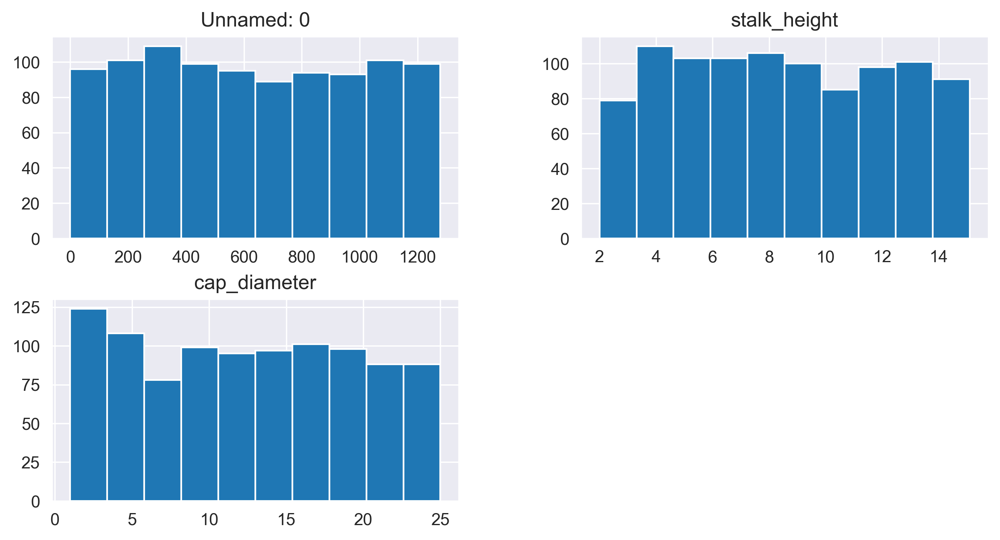

In [31]:
df.hist()
plt.tight_layout

<Axes: >

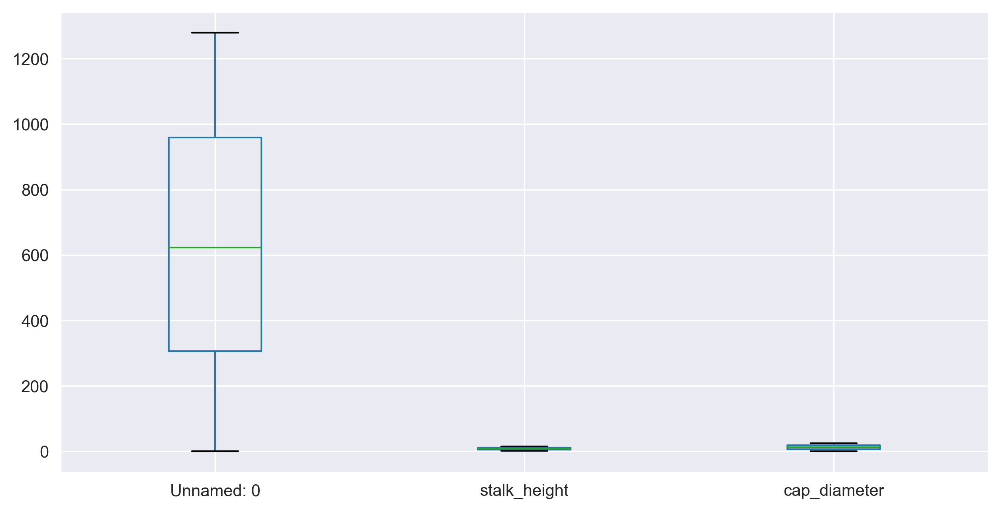

In [32]:
df.boxplot()

# As we can see from the above boxplot and histogram, there are no outliers. However, because so many columns are in categorical values, once we do the encoding approach, we may try to visualize for the boxplot whether any outliers would reflect or not.

# Encoding

In [33]:
from sklearn.preprocessing import OrdinalEncoder

# Selecting only categorical columns

In [34]:
df.select_dtypes(object).columns

Index(['cap_shape', 'cap_surface', 'cap_color', 'bruises', 'odor',
       'gill_attachment', 'gill_spacing', 'gill_size', 'gill_color',
       'stalk_shape', 'stalk_root', 'stalk_surface_above_ring',
       'stalk_surface_below_ring', 'stalk_color_above_ring',
       'stalk_color_below_ring', 'veil_type', 'veil_color', 'ring_number',
       'ring_type', 'spore_print_color', 'population', 'habitat', 'class'],
      dtype='object')

In [35]:
cat_columns = df.select_dtypes(object).columns
cat_columns

Index(['cap_shape', 'cap_surface', 'cap_color', 'bruises', 'odor',
       'gill_attachment', 'gill_spacing', 'gill_size', 'gill_color',
       'stalk_shape', 'stalk_root', 'stalk_surface_above_ring',
       'stalk_surface_below_ring', 'stalk_color_above_ring',
       'stalk_color_below_ring', 'veil_type', 'veil_color', 'ring_number',
       'ring_type', 'spore_print_color', 'population', 'habitat', 'class'],
      dtype='object')

In [36]:
df[cat_columns]

,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,stalk_shape,...,stalk_color_above_ring,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class
0,sunken,scaly,white,no,anise,descending,distant,broad,pink,tapering,...,gray,yellow,partial,brown,two,sheathing,chocolate,clustered,waste,poisonous
1,sunken,fibrous,red,no,anise,notched,crowded,narrow,chocolate,enlarging,...,cinnamon,brown,universal,brown,two,sheathing,brown,numerous,waste,edible
2,flat,grooves,purple,yes,foul,descending,crowded,broad,purple,tapering,...,yellow,gray,universal,yellow,two,sheathing,purple,abundant,waste,poisonous
3,bell,scaly,pink,yes,fishy,notched,close,broad,orange,enlarging,...,yellow,pink,partial,yellow,two,cobwebby,green,clustered,grasses,poisonous
4,flat,smooth,yellow,yes,musty,free,crowded,narrow,orange,enlarging,...,gray,white,universal,white,one,sheathing,yellow,clustered,urban,poisonous
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,conical,grooves,brown,no,foul,notched,crowded,broad,chocolate,tapering,...,red,yellow,universal,brown,one,large,brown,numerous,paths,edible
1988,bell,grooves,pink,yes,anise,descending,distant,broad,brown,enlarging,...,pink,pink,partial,brown,two,pendant,yellow,numerous,grasses,poisonous
1989,sunken,smooth,purple,yes,anise,descending,crowded,narrow,buff,tapering,...,brown,red,universal,orange,two,sheathing,orange,abundant,grasses,edible
1996,sunken,scaly,purple,yes,musty,attached,distant,narrow,red,tapering,...,pink,orange,partial,white,one,zone,yellow,numerous,waste,poisonous


In [37]:
oe = OrdinalEncoder ()

df[cat_columns] = oe.fit_transform(df[cat_columns])

In [38]:
df[cat_columns]

,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,stalk_shape,...,stalk_color_above_ring,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class
0,4.0,2.0,7.0,0.0,1.0,1.0,2.0,0.0,7.0,1.0,...,3.0,8.0,0.0,0.0,1.0,5.0,3.0,1.0,5.0,1.0
1,4.0,0.0,6.0,0.0,1.0,3.0,1.0,1.0,3.0,0.0,...,2.0,0.0,1.0,0.0,1.0,5.0,1.0,2.0,5.0,0.0
2,3.0,1.0,5.0,1.0,4.0,1.0,1.0,0.0,8.0,1.0,...,8.0,3.0,1.0,3.0,1.0,5.0,6.0,0.0,5.0,1.0
3,0.0,2.0,4.0,1.0,3.0,3.0,0.0,0.0,6.0,0.0,...,8.0,5.0,0.0,3.0,1.0,0.0,4.0,1.0,0.0,1.0
4,3.0,3.0,8.0,1.0,5.0,2.0,1.0,1.0,6.0,0.0,...,3.0,7.0,1.0,2.0,0.0,5.0,8.0,1.0,4.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,1.0,1.0,0.0,0.0,4.0,3.0,1.0,0.0,3.0,1.0,...,6.0,8.0,1.0,0.0,0.0,3.0,1.0,2.0,3.0,0.0
1988,0.0,1.0,4.0,1.0,1.0,1.0,2.0,0.0,1.0,0.0,...,5.0,5.0,0.0,0.0,1.0,4.0,8.0,2.0,0.0,1.0
1989,4.0,3.0,5.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,...,0.0,6.0,1.0,1.0,1.0,5.0,5.0,0.0,0.0,0.0
1996,4.0,2.0,5.0,1.0,5.0,0.0,2.0,1.0,9.0,1.0,...,5.0,4.0,0.0,2.0,0.0,6.0,8.0,2.0,5.0,1.0


In [39]:
df.dtypes

Unnamed: 0                    int64
cap_shape                   float64
cap_surface                 float64
cap_color                   float64
bruises                     float64
odor                        float64
gill_attachment             float64
gill_spacing                float64
gill_size                   float64
gill_color                  float64
stalk_shape                 float64
stalk_root                  float64
stalk_surface_above_ring    float64
stalk_surface_below_ring    float64
stalk_color_above_ring      float64
stalk_color_below_ring      float64
veil_type                   float64
veil_color                  float64
ring_number                 float64
ring_type                   float64
spore_print_color           float64
population                  float64
habitat                     float64
class                       float64
stalk_height                float64
cap_diameter                float64
dtype: object

In [40]:
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,4.0,2.0,7.0,0.0,1.0,1.0,2.0,0.0,7.0,...,0.0,0.0,1.0,5.0,3.0,1.0,5.0,1.0,14.276173,5.054983
1,1037,4.0,0.0,6.0,0.0,1.0,3.0,1.0,1.0,3.0,...,1.0,0.0,1.0,5.0,1.0,2.0,5.0,0.0,3.952715,19.068319
2,309,3.0,1.0,5.0,1.0,4.0,1.0,1.0,0.0,8.0,...,1.0,3.0,1.0,5.0,6.0,0.0,5.0,1.0,9.054265,7.205884
3,282,0.0,2.0,4.0,1.0,3.0,3.0,0.0,0.0,6.0,...,0.0,3.0,1.0,0.0,4.0,1.0,0.0,1.0,5.226499,20.932692
4,820,3.0,3.0,8.0,1.0,5.0,2.0,1.0,1.0,6.0,...,1.0,2.0,0.0,5.0,8.0,1.0,4.0,1.0,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,877,1.0,1.0,0.0,0.0,4.0,3.0,1.0,0.0,3.0,...,1.0,0.0,0.0,3.0,1.0,2.0,3.0,0.0,13.020616,9.993008
1988,926,0.0,1.0,4.0,1.0,1.0,1.0,2.0,0.0,1.0,...,0.0,0.0,1.0,4.0,8.0,2.0,0.0,1.0,3.751597,18.868135
1989,289,4.0,3.0,5.0,1.0,1.0,1.0,1.0,1.0,2.0,...,1.0,1.0,1.0,5.0,5.0,0.0,0.0,0.0,13.134058,15.740028
1996,1160,4.0,2.0,5.0,1.0,5.0,0.0,2.0,1.0,9.0,...,0.0,2.0,0.0,6.0,8.0,2.0,5.0,1.0,6.500840,13.501957


# Now we can convert all of the category columns to numerical values. We may now try to visualize whether we can find any outliers or not.

<Axes: >

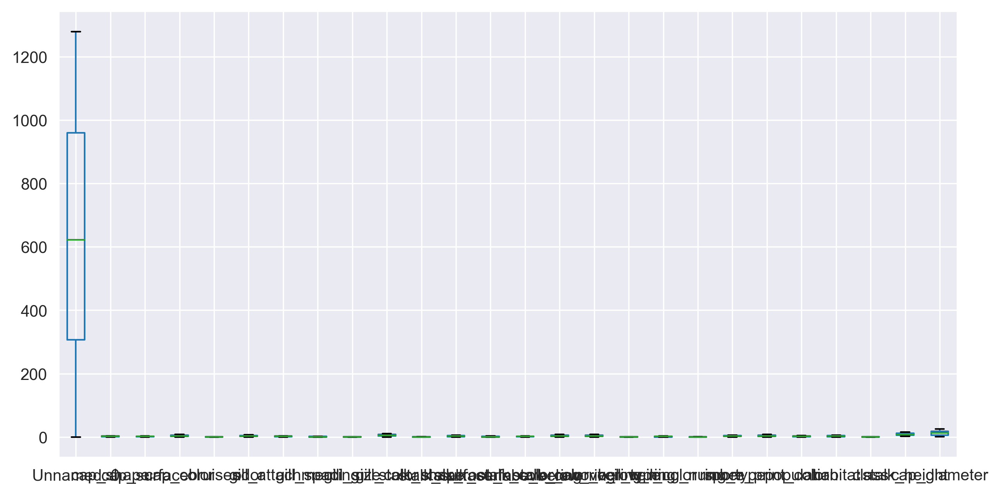

In [41]:
df.boxplot()

# df.boxplot The pandas libraries do not display all of the columns that are quite clear. As a result, we can now test visualization using Matplotlib.

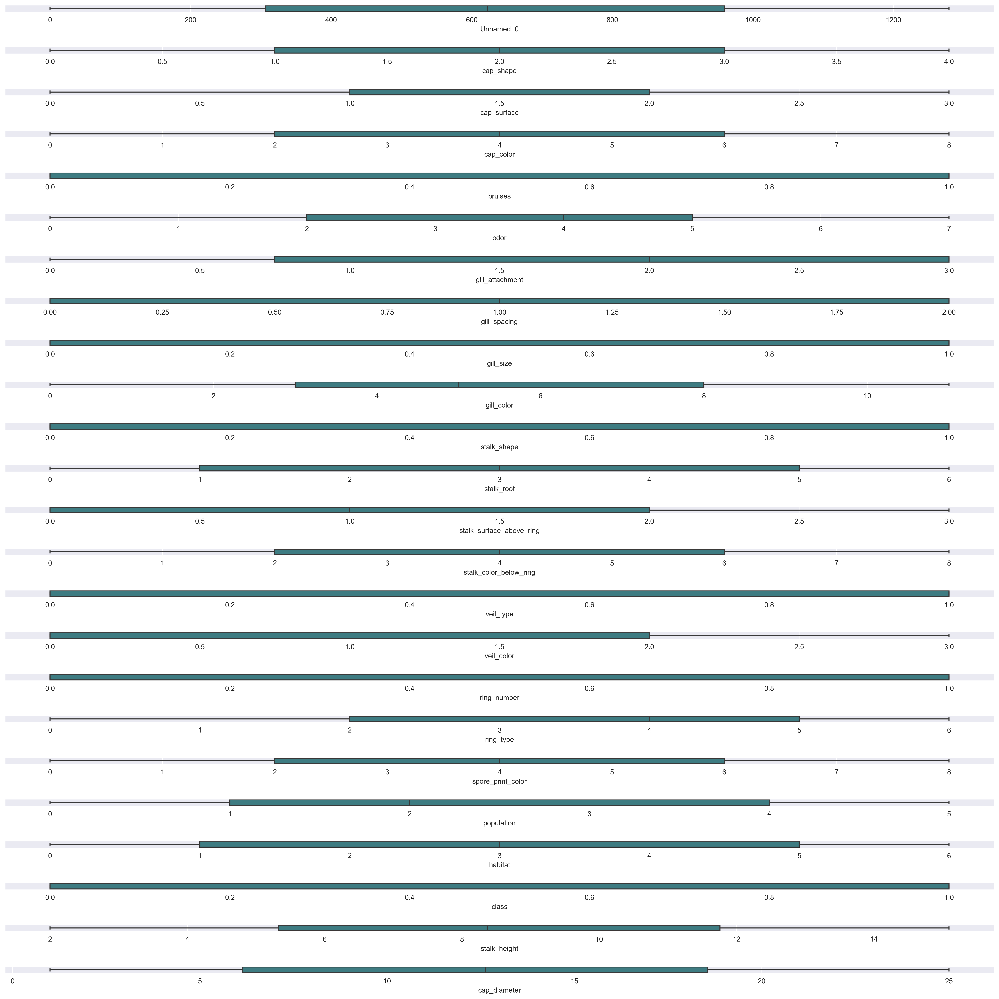

In [42]:
ot=df.copy() 
fig, axes=plt.subplots(24,1,figsize=(20,20),sharex=False,sharey=False)
sns.boxplot(x='Unnamed: 0',data=ot,palette='crest',ax=axes[0])
sns.boxplot(x='cap_shape',data=ot,palette='crest',ax=axes[1])
sns.boxplot(x='cap_surface',data=ot,palette='crest',ax=axes[2])
sns.boxplot(x='cap_color',data=ot,palette='crest',ax=axes[3])
sns.boxplot(x='bruises',data=ot,palette='crest',ax=axes[4])
sns.boxplot(x='odor',data=ot,palette='crest',ax=axes[5])
sns.boxplot(x='gill_attachment',data=ot,palette='crest',ax=axes[6])
sns.boxplot(x='gill_spacing',data=ot,palette='crest',ax=axes[7])
sns.boxplot(x='gill_size',data=ot,palette='crest',ax=axes[8])
sns.boxplot(x='gill_color',data=ot,palette='crest',ax=axes[9])
sns.boxplot(x='stalk_shape',data=ot,palette='crest',ax=axes[10])
sns.boxplot(x='stalk_root',data=ot,palette='crest',ax=axes[11])
sns.boxplot(x='stalk_surface_above_ring',data=ot,palette='crest',ax=axes[12])
sns.boxplot(x='stalk_color_below_ring',data=ot,palette='crest',ax=axes[13])
sns.boxplot(x='veil_type',data=ot,palette='crest',ax=axes[14])
sns.boxplot(x='veil_color',data=ot,palette='crest',ax=axes[15])
sns.boxplot(x='ring_number',data=ot,palette='crest',ax=axes[16])
sns.boxplot(x='ring_type',data=ot,palette='crest',ax=axes[17])
sns.boxplot(x='spore_print_color',data=ot,palette='crest',ax=axes[18])
sns.boxplot(x='population',data=ot,palette='crest',ax=axes[19])
sns.boxplot(x='habitat',data=ot,palette='crest',ax=axes[20])
sns.boxplot(x='class',data=ot,palette='crest',ax=axes[21])
sns.boxplot(x='stalk_height',data=ot,palette='crest',ax=axes[22])
sns.boxplot(x='cap_diameter',data=ot,palette='crest',ax=axes[23])
plt.tight_layout(pad=2.0)

# As may be seen from the boxplots above, the data contains no outliers. Hence, we do not perform any capping procedures like remove, replace, and maintain the outliers.

# Scatter Plot and Correlation

In [43]:
sns.pairplot(df)

# As we can see above, the scatter plot relationship makes it difficult to discern anything clearly. Thus, we may plot the correlation coefficient.

# Correlation coefficient

In [44]:
df.corr()

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
Unnamed: 0,1.000000,-0.002662,-0.025126,0.040939,-0.019980,-0.028260,-0.016446,0.043219,0.025476,0.018908,...,0.032241,0.003575,-0.035011,0.003718,-0.004192,0.007227,0.033891,0.021431,0.000815,0.042726
cap_shape,-0.002662,1.000000,0.024645,0.020694,-0.007043,-0.027603,0.017091,-0.026279,0.017675,0.050239,...,-0.015447,-0.004381,0.046614,0.009682,0.008641,0.009890,-0.003017,0.008132,-0.019087,0.015284
cap_surface,-0.025126,0.024645,1.000000,0.010129,-0.013355,0.005748,-0.008412,0.033273,-0.046493,0.033423,...,-0.042954,0.027026,0.005849,-0.008832,-0.057301,-0.026943,-0.038786,-0.047799,0.026016,0.030579
cap_color,0.040939,0.020694,0.010129,1.000000,0.007862,-0.046538,0.000201,0.001367,0.034965,0.005884,...,-0.008664,-0.027817,0.026143,0.023656,0.045805,-0.039548,-0.006857,-0.048735,0.026948,0.006289
bruises,-0.019980,-0.007043,-0.013355,0.007862,1.000000,0.043650,0.006422,-0.017566,-0.004689,-0.033166,...,0.007497,-0.023444,-0.025904,-0.064222,-0.028591,0.014990,0.011681,-0.007932,0.067729,-0.049061
odor,-0.028260,-0.027603,0.005748,-0.046538,0.043650,1.000000,-0.025764,-0.020476,-0.068863,-0.019464,...,0.028470,0.021238,-0.002266,0.000793,-0.073189,-0.000796,-0.028664,0.012791,-0.006641,-0.039683
gill_attachment,-0.016446,0.017091,-0.008412,0.000201,0.006422,-0.025764,1.000000,-0.024634,-0.011606,0.026293,...,-0.044643,-0.005227,0.067047,-0.044882,-0.020564,0.003722,-0.020783,-0.023758,-0.002778,-0.012882
gill_spacing,0.043219,-0.026279,0.033273,0.001367,-0.017566,-0.020476,-0.024634,1.000000,0.012648,-0.004135,...,-0.027653,-0.003433,-0.014642,-0.000253,0.023472,0.005042,0.024691,0.045121,0.006502,0.034553
gill_size,0.025476,0.017675,-0.046493,0.034965,-0.004689,-0.068863,-0.011606,0.012648,1.000000,-0.022993,...,-0.041509,-0.005179,-0.024827,0.010898,0.033767,0.002667,0.014063,0.019853,-0.017483,-0.029404
gill_color,0.018908,0.050239,0.033423,0.005884,-0.033166,-0.019464,0.026293,-0.004135,-0.022993,1.000000,...,-0.024141,-0.011001,-0.029483,0.006534,0.005718,0.024611,0.014710,-0.000277,0.025211,-0.008795


<Axes: >

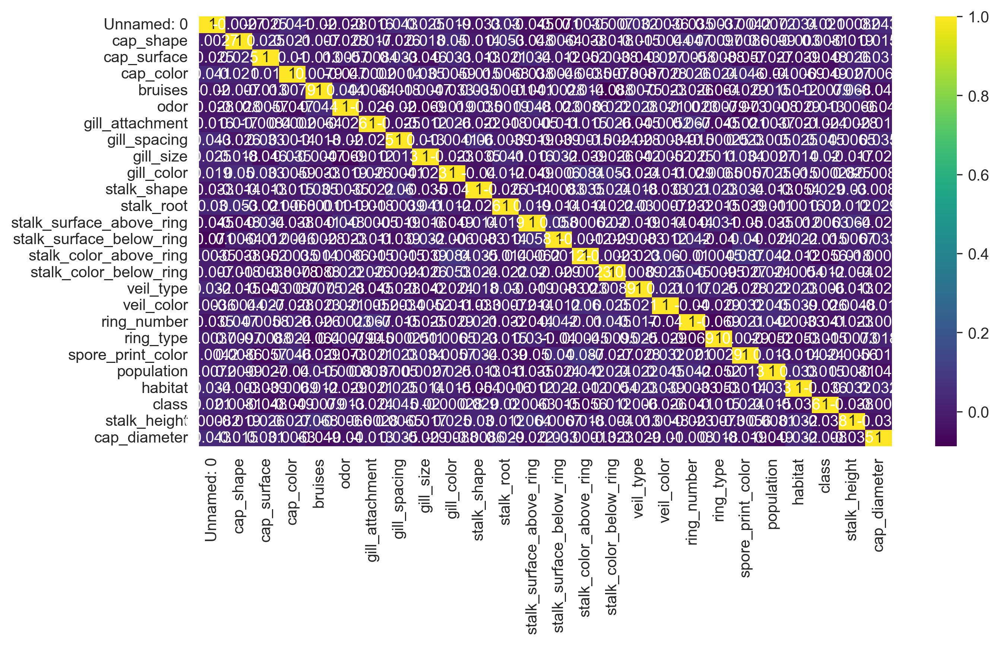

In [45]:
sns.heatmap(df.corr(),annot=True, cmap="viridis")

# Data Split into two x and y

In [46]:
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter
0,1167,4.0,2.0,7.0,0.0,1.0,1.0,2.0,0.0,7.0,...,0.0,0.0,1.0,5.0,3.0,1.0,5.0,1.0,14.276173,5.054983
1,1037,4.0,0.0,6.0,0.0,1.0,3.0,1.0,1.0,3.0,...,1.0,0.0,1.0,5.0,1.0,2.0,5.0,0.0,3.952715,19.068319
2,309,3.0,1.0,5.0,1.0,4.0,1.0,1.0,0.0,8.0,...,1.0,3.0,1.0,5.0,6.0,0.0,5.0,1.0,9.054265,7.205884
3,282,0.0,2.0,4.0,1.0,3.0,3.0,0.0,0.0,6.0,...,0.0,3.0,1.0,0.0,4.0,1.0,0.0,1.0,5.226499,20.932692
4,820,3.0,3.0,8.0,1.0,5.0,2.0,1.0,1.0,6.0,...,1.0,2.0,0.0,5.0,8.0,1.0,4.0,1.0,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,877,1.0,1.0,0.0,0.0,4.0,3.0,1.0,0.0,3.0,...,1.0,0.0,0.0,3.0,1.0,2.0,3.0,0.0,13.020616,9.993008
1988,926,0.0,1.0,4.0,1.0,1.0,1.0,2.0,0.0,1.0,...,0.0,0.0,1.0,4.0,8.0,2.0,0.0,1.0,3.751597,18.868135
1989,289,4.0,3.0,5.0,1.0,1.0,1.0,1.0,1.0,2.0,...,1.0,1.0,1.0,5.0,5.0,0.0,0.0,0.0,13.134058,15.740028
1996,1160,4.0,2.0,5.0,1.0,5.0,0.0,2.0,1.0,9.0,...,0.0,2.0,0.0,6.0,8.0,2.0,5.0,1.0,6.500840,13.501957


In [47]:
x = pd.concat([df.iloc[:, :23], df.iloc[:, 24:26]], axis=1)
y = df.iloc[:, 23]

In [48]:
x

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter
0,1167,4.0,2.0,7.0,0.0,1.0,1.0,2.0,0.0,7.0,...,8.0,0.0,0.0,1.0,5.0,3.0,1.0,5.0,14.276173,5.054983
1,1037,4.0,0.0,6.0,0.0,1.0,3.0,1.0,1.0,3.0,...,0.0,1.0,0.0,1.0,5.0,1.0,2.0,5.0,3.952715,19.068319
2,309,3.0,1.0,5.0,1.0,4.0,1.0,1.0,0.0,8.0,...,3.0,1.0,3.0,1.0,5.0,6.0,0.0,5.0,9.054265,7.205884
3,282,0.0,2.0,4.0,1.0,3.0,3.0,0.0,0.0,6.0,...,5.0,0.0,3.0,1.0,0.0,4.0,1.0,0.0,5.226499,20.932692
4,820,3.0,3.0,8.0,1.0,5.0,2.0,1.0,1.0,6.0,...,7.0,1.0,2.0,0.0,5.0,8.0,1.0,4.0,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,877,1.0,1.0,0.0,0.0,4.0,3.0,1.0,0.0,3.0,...,8.0,1.0,0.0,0.0,3.0,1.0,2.0,3.0,13.020616,9.993008
1988,926,0.0,1.0,4.0,1.0,1.0,1.0,2.0,0.0,1.0,...,5.0,0.0,0.0,1.0,4.0,8.0,2.0,0.0,3.751597,18.868135
1989,289,4.0,3.0,5.0,1.0,1.0,1.0,1.0,1.0,2.0,...,6.0,1.0,1.0,1.0,5.0,5.0,0.0,0.0,13.134058,15.740028
1996,1160,4.0,2.0,5.0,1.0,5.0,0.0,2.0,1.0,9.0,...,4.0,0.0,2.0,0.0,6.0,8.0,2.0,5.0,6.500840,13.501957


In [49]:
y

0       1.0
1       0.0
2       1.0
3       1.0
4       1.0
       ... 
1985    0.0
1988    1.0
1989    0.0
1996    1.0
1999    1.0
Name: class, Length: 976, dtype: float64

In [50]:
print("Shape of X:", x.shape)
print("Shape of y:", y.shape)

Shape of X: (976, 25)
Shape of y: (976,)


# Feature Selection

In [53]:
!pip install yellowbrick
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from yellowbrick.model_selection import rfecv

Defaulting to user installation because normal site-packages is not writeable


# Univariate Selection

- We use Chi2 test to perform the feature selection.
- When two features are independent, the observed count is close to the expected count, thus we will have smaller Chi-Square value. So high Chi-Square value indicates that the hypothesis of independence is incorrect. 
- In simple words, higher the Chi-Square value the feature is more dependent on the response and it can be selected for model training.

# Chi square for feature selection 

In [54]:
test = SelectKBest(score_func=chi2, k=5)

test.fit(x,y)

SelectKBest(k=5, score_func=<function chi2 at 0x0000029BFFE69580>)

In [55]:
x.columns

Index(['Unnamed: 0', 'cap_shape', 'cap_surface', 'cap_color', 'bruises',
       'odor', 'gill_attachment', 'gill_spacing', 'gill_size', 'gill_color',
       'stalk_shape', 'stalk_root', 'stalk_surface_above_ring',
       'stalk_surface_below_ring', 'stalk_color_above_ring',
       'stalk_color_below_ring', 'veil_type', 'veil_color', 'ring_number',
       'ring_type', 'spore_print_color', 'population', 'habitat',
       'stalk_height', 'cap_diameter'],
      dtype='object')

In [56]:
test.scores_

array([9.79948560e+01, 6.40281376e-02, 1.74692225e+00, 4.06636096e+00,
       2.98241144e-02, 2.06550820e-01, 4.51156839e-01, 1.31786961e+00,
       1.88393791e-01, 1.57239676e-04, 4.39824177e-01, 5.47872423e-01,
       3.34850190e-02, 1.71239290e-01, 5.12411631e+00, 2.38511110e-01,
       1.69172859e-02, 5.50927807e-01, 1.11510646e+00, 2.54148391e-01,
       9.63779409e-01, 2.59839487e-01, 1.52226482e+00, 2.32150352e+00,
       2.40280200e-01])

In [57]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,976.0,633.275615,372.262936,0.0,306.750000,622.500000,959.250000,1279.000000
cap_shape,976.0,2.065574,1.432159,0.0,1.000000,2.000000,3.000000,4.000000
cap_surface,976.0,1.548156,1.101857,0.0,1.000000,2.000000,2.000000,3.000000
cap_color,976.0,3.924180,2.625006,0.0,2.000000,4.000000,6.000000,8.000000
bruises,976.0,0.514344,0.500050,0.0,0.000000,1.000000,1.000000,1.000000
odor,976.0,3.558402,2.146594,0.0,2.000000,4.000000,5.000000,7.000000
gill_attachment,976.0,1.534836,1.121727,0.0,0.750000,2.000000,3.000000,3.000000
gill_spacing,976.0,0.997951,0.813978,0.0,0.000000,1.000000,2.000000,2.000000
gill_size,976.0,0.510246,0.500151,0.0,0.000000,1.000000,1.000000,1.000000
gill_color,976.0,5.445697,3.385205,0.0,3.000000,5.000000,8.000000,11.000000


In [58]:
pd.DataFrame({
    'Features' : x.columns,
    'Test' : test.scores_
})

,Features,Test
0,Unnamed: 0,97.994856
1,cap_shape,0.064028
2,cap_surface,1.746922
3,cap_color,4.066361
4,bruises,0.029824
5,odor,0.206551
6,gill_attachment,0.451157
7,gill_spacing,1.317870
8,gill_size,0.188394
9,gill_color,0.000157


In [59]:
pd.DataFrame(test.scores_).T

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,97.994856,0.064028,1.746922,4.066361,0.029824,0.206551,0.451157,1.31787,0.188394,0.000157,...,0.238511,0.016917,0.550928,1.115106,0.254148,0.963779,0.259839,1.522265,2.321504,0.24028


In [60]:
univariate = pd.DataFrame(test.scores_).T
univariate
univariate.columns = x.columns
univariate

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter
0,97.994856,0.064028,1.746922,4.066361,0.029824,0.206551,0.451157,1.31787,0.188394,0.000157,...,0.238511,0.016917,0.550928,1.115106,0.254148,0.963779,0.259839,1.522265,2.321504,0.24028


# Recursive Feature Elimination

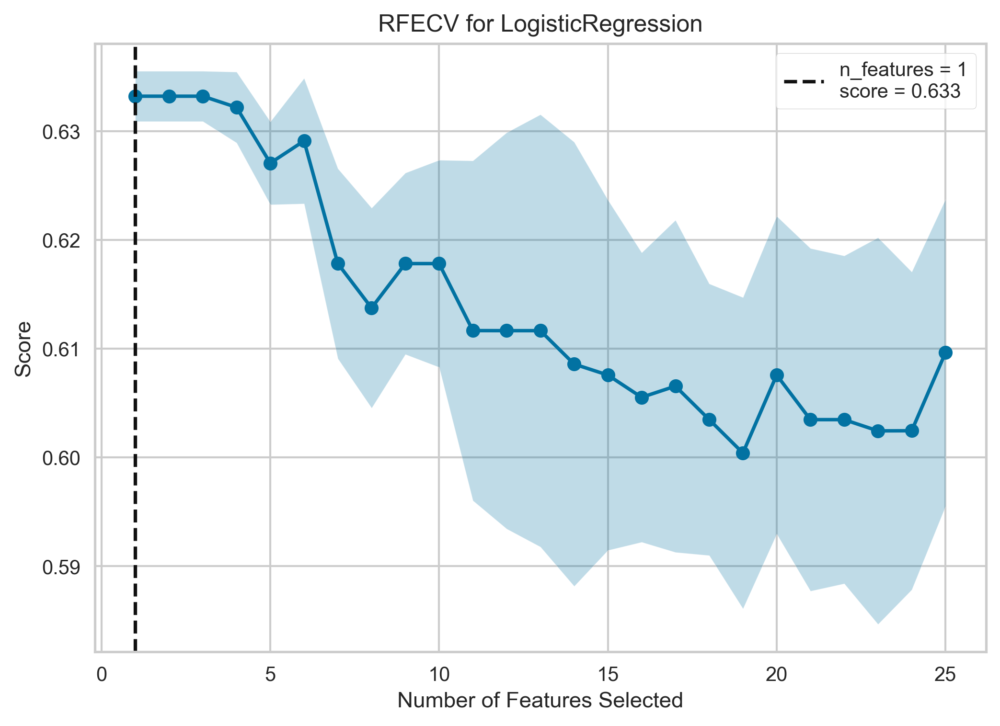

In [63]:
rfe = rfecv(LogisticRegression(),x,y)

In [64]:
rfe.ranking_

array([25, 20,  4, 10, 11, 21,  8,  3,  5, 23,  2, 19, 18, 12,  6, 22, 14,
        9,  1, 13, 15, 16,  7, 17, 24])

In [65]:
rfe_Sel = pd.DataFrame({
    'Ranking' : rfe.ranking_,
    'Features' : x.columns
})

In [66]:
rfe_Sel

,Ranking,Features
0,25,Unnamed: 0
1,20,cap_shape
2,4,cap_surface
3,10,cap_color
4,11,bruises
5,21,odor
6,8,gill_attachment
7,3,gill_spacing
8,5,gill_size
9,23,gill_color


In [ ]:
ring_number, stalk_shape, gill_spacing, cap_surface

In [67]:
rfe_Sel[rfe_Sel['Ranking']==1]

,Ranking,Features
18,1,ring_number


# Tree Based method

In [68]:
dt = DecisionTreeClassifier()

dt.fit(x,y)

DecisionTreeClassifier()

In [69]:
dt.feature_importances_

array([0.12410389, 0.0391636 , 0.01150413, 0.03302372, 0.01464789,
       0.02682946, 0.02940255, 0.02952262, 0.02271371, 0.06331747,
       0.00251439, 0.05520652, 0.03003335, 0.02522766, 0.04140851,
       0.06110871, 0.00352914, 0.01967786, 0.00317094, 0.03609136,
       0.06072821, 0.02660093, 0.03218871, 0.05926166, 0.14902304])

In [70]:
ig_sel = pd.DataFrame({
    'IG': dt.feature_importances_,
    'Features' : x.columns
})

In [71]:
ig_sel

,IG,Features
0,0.124104,Unnamed: 0
1,0.039164,cap_shape
2,0.011504,cap_surface
3,0.033024,cap_color
4,0.014648,bruises
5,0.026829,odor
6,0.029403,gill_attachment
7,0.029523,gill_spacing
8,0.022714,gill_size
9,0.063317,gill_color


In [72]:
ig_sel.sort_values(by='IG', ascending=False)

,IG,Features
24,0.149023,cap_diameter
0,0.124104,Unnamed: 0
9,0.063317,gill_color
15,0.061109,stalk_color_below_ring
20,0.060728,spore_print_color
23,0.059262,stalk_height
11,0.055207,stalk_root
14,0.041409,stalk_color_above_ring
1,0.039164,cap_shape
19,0.036091,ring_type


# 

- Unnamed: 0
- cap_surface
- ring_number

# EDA 2

In [73]:
from sklearn.ensemble import IsolationForest

In [76]:
iso = IsolationForest ()

iso.fit(df)

IsolationForest()

In [77]:
outlier = iso.predict(df)

outlier

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,  1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1,  1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1

In [78]:
df['Outliers'] = outlier

In [79]:
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter,Outliers
0,1167,4.0,2.0,7.0,0.0,1.0,1.0,2.0,0.0,7.0,...,0.0,1.0,5.0,3.0,1.0,5.0,1.0,14.276173,5.054983,-1
1,1037,4.0,0.0,6.0,0.0,1.0,3.0,1.0,1.0,3.0,...,0.0,1.0,5.0,1.0,2.0,5.0,0.0,3.952715,19.068319,-1
2,309,3.0,1.0,5.0,1.0,4.0,1.0,1.0,0.0,8.0,...,3.0,1.0,5.0,6.0,0.0,5.0,1.0,9.054265,7.205884,-1
3,282,0.0,2.0,4.0,1.0,3.0,3.0,0.0,0.0,6.0,...,3.0,1.0,0.0,4.0,1.0,0.0,1.0,5.226499,20.932692,-1
4,820,3.0,3.0,8.0,1.0,5.0,2.0,1.0,1.0,6.0,...,2.0,0.0,5.0,8.0,1.0,4.0,1.0,14.037532,12.545245,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,877,1.0,1.0,0.0,0.0,4.0,3.0,1.0,0.0,3.0,...,0.0,0.0,3.0,1.0,2.0,3.0,0.0,13.020616,9.993008,-1
1988,926,0.0,1.0,4.0,1.0,1.0,1.0,2.0,0.0,1.0,...,0.0,1.0,4.0,8.0,2.0,0.0,1.0,3.751597,18.868135,-1
1989,289,4.0,3.0,5.0,1.0,1.0,1.0,1.0,1.0,2.0,...,1.0,1.0,5.0,5.0,0.0,0.0,0.0,13.134058,15.740028,-1
1996,1160,4.0,2.0,5.0,1.0,5.0,0.0,2.0,1.0,9.0,...,2.0,0.0,6.0,8.0,2.0,5.0,1.0,6.500840,13.501957,-1


<Axes: xlabel='Unnamed: 0', ylabel='ring_number'>

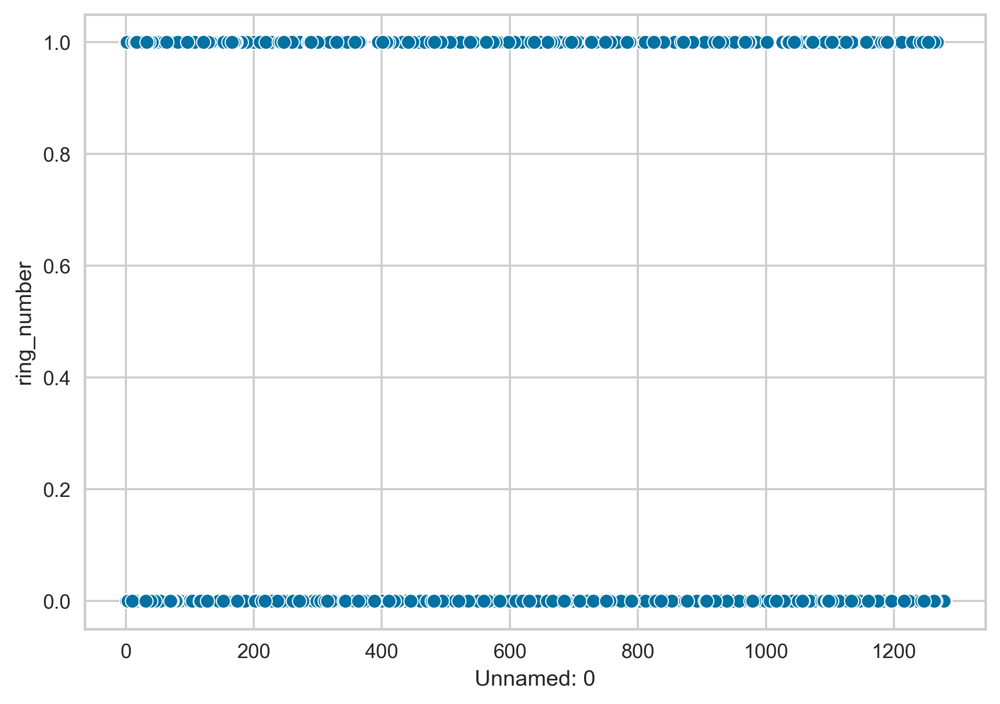

In [80]:
sns.scatterplot(x = df['Unnamed: 0'],y =  df['ring_number'])

In [81]:
len(df[df['Outliers'] == -1])

973

In [82]:
df['Outliers'].value_counts()

-1    973
 1      3
Name: Outliers, dtype: int64

In [83]:
data = df[df['Outliers'] == 1]
data

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter,Outliers
122,1004,2.0,1.0,2.0,1.0,4.0,0.0,1.0,1.0,9.0,...,2.0,0.0,4.0,4.0,2.0,5.0,1.0,11.089717,11.400122,1
166,194,2.0,1.0,4.0,1.0,5.0,1.0,1.0,1.0,5.0,...,1.0,0.0,5.0,6.0,2.0,1.0,1.0,10.354817,6.084562,1
1044,386,1.0,2.0,5.0,1.0,4.0,2.0,1.0,1.0,2.0,...,1.0,0.0,1.0,6.0,3.0,3.0,1.0,8.290076,18.521273,1


# PPS

In [84]:
pip install ppscore

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [85]:
import ppscore as ps

In [86]:
ps.score(df, x='Unnamed: 0',y = 'class')

{'x': 'Unnamed: 0',
 'y': 'class',
 'ppscore': 0,
 'case': 'regression',
 'is_valid_score': True,
 'metric': 'mean absolute error',
 'baseline_score': 0.3668032786885246,
 'model_score': 0.4600409836065574,
 'model': DecisionTreeRegressor()}

In [87]:
feature_sel = ps.matrix(df)

In [88]:
feature_sel

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
0,Unnamed: 0,Unnamed: 0,1.0,predict_itself,True,None,0.000000,1.000000,None
1,Unnamed: 0,cap_shape,0.0,regression,True,mean absolute error,1.227459,1.611680,DecisionTreeRegressor()
2,Unnamed: 0,cap_surface,0.0,regression,True,mean absolute error,0.939549,1.230533,DecisionTreeRegressor()
3,Unnamed: 0,cap_color,0.0,regression,True,mean absolute error,2.256148,3.034836,DecisionTreeRegressor()
4,Unnamed: 0,bruises,0.0,regression,True,mean absolute error,0.485656,0.519467,DecisionTreeRegressor()
...,...,...,...,...,...,...,...,...,...
724,Outliers,habitat,0.0,regression,True,mean absolute error,1.649590,1.663134,DecisionTreeRegressor()
725,Outliers,class,0.0,regression,True,mean absolute error,0.366803,0.464190,DecisionTreeRegressor()
726,Outliers,stalk_height,0.0,regression,True,mean absolute error,3.193904,3.198891,DecisionTreeRegressor()
727,Outliers,cap_diameter,0.0,regression,True,mean absolute error,6.070047,6.083693,DecisionTreeRegressor()


In [89]:
feature_sel[feature_sel['y'] == 'class']

,x,y,ppscore,case,is_valid_score,metric,baseline_score,model_score,model
23,Unnamed: 0,class,0.0,regression,True,mean absolute error,0.366803,0.460041,DecisionTreeRegressor()
50,cap_shape,class,0.0,regression,True,mean absolute error,0.366803,0.466202,DecisionTreeRegressor()
77,cap_surface,class,0.0,regression,True,mean absolute error,0.366803,0.463098,DecisionTreeRegressor()
104,cap_color,class,0.0,regression,True,mean absolute error,0.366803,0.464387,DecisionTreeRegressor()
131,bruises,class,0.0,regression,True,mean absolute error,0.366803,0.465659,DecisionTreeRegressor()
158,odor,class,0.0,regression,True,mean absolute error,0.366803,0.465903,DecisionTreeRegressor()
185,gill_attachment,class,0.0,regression,True,mean absolute error,0.366803,0.467400,DecisionTreeRegressor()
212,gill_spacing,class,0.0,regression,True,mean absolute error,0.366803,0.464478,DecisionTreeRegressor()
239,gill_size,class,0.0,regression,True,mean absolute error,0.366803,0.465083,DecisionTreeRegressor()
266,gill_color,class,0.0,regression,True,mean absolute error,0.366803,0.469758,DecisionTreeRegressor()


# Model building

In [90]:
x

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter
0,1167,4.0,2.0,7.0,0.0,1.0,1.0,2.0,0.0,7.0,...,8.0,0.0,0.0,1.0,5.0,3.0,1.0,5.0,14.276173,5.054983
1,1037,4.0,0.0,6.0,0.0,1.0,3.0,1.0,1.0,3.0,...,0.0,1.0,0.0,1.0,5.0,1.0,2.0,5.0,3.952715,19.068319
2,309,3.0,1.0,5.0,1.0,4.0,1.0,1.0,0.0,8.0,...,3.0,1.0,3.0,1.0,5.0,6.0,0.0,5.0,9.054265,7.205884
3,282,0.0,2.0,4.0,1.0,3.0,3.0,0.0,0.0,6.0,...,5.0,0.0,3.0,1.0,0.0,4.0,1.0,0.0,5.226499,20.932692
4,820,3.0,3.0,8.0,1.0,5.0,2.0,1.0,1.0,6.0,...,7.0,1.0,2.0,0.0,5.0,8.0,1.0,4.0,14.037532,12.545245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,877,1.0,1.0,0.0,0.0,4.0,3.0,1.0,0.0,3.0,...,8.0,1.0,0.0,0.0,3.0,1.0,2.0,3.0,13.020616,9.993008
1988,926,0.0,1.0,4.0,1.0,1.0,1.0,2.0,0.0,1.0,...,5.0,0.0,0.0,1.0,4.0,8.0,2.0,0.0,3.751597,18.868135
1989,289,4.0,3.0,5.0,1.0,1.0,1.0,1.0,1.0,2.0,...,6.0,1.0,1.0,1.0,5.0,5.0,0.0,0.0,13.134058,15.740028
1996,1160,4.0,2.0,5.0,1.0,5.0,0.0,2.0,1.0,9.0,...,4.0,0.0,2.0,0.0,6.0,8.0,2.0,5.0,6.500840,13.501957


In [91]:
y

0       1.0
1       0.0
2       1.0
3       1.0
4       1.0
       ... 
1985    0.0
1988    1.0
1989    0.0
1996    1.0
1999    1.0
Name: class, Length: 976, dtype: float64

In [92]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y, test_size=0.2, random_state=42)
svc = SVC()

svc.fit(xtrain,ytrain)
ypred = svc.predict(xtest)
print(svc.score(xtrain,ytrain))
print(svc.score(xtest,ytest))

0.6333333333333333
0.6326530612244898


# 
- Despite the fact, that SVC works like magic when it comes to classification,still the accuracy is very bad and the model is overfitted.
- The reason is not performing feature scaling before model.
- As there is distance calculation involved in svc, Scaling is mandatory step!

# StandardScaler

In [93]:
sc = StandardScaler()
x = sc.fit_transform(x)

In [94]:
xtrain

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,stalk_color_below_ring,veil_type,veil_color,ring_number,ring_type,spore_print_color,population,habitat,stalk_height,cap_diameter
990,567,2.0,0.0,0.0,0.0,0.0,3.0,1.0,0.0,10.0,...,7.0,1.0,3.0,0.0,6.0,8.0,5.0,2.0,6.652204,13.983271
899,104,4.0,2.0,5.0,1.0,5.0,1.0,2.0,1.0,0.0,...,3.0,0.0,3.0,0.0,6.0,4.0,1.0,3.0,11.954210,21.043446
33,699,1.0,0.0,4.0,0.0,2.0,0.0,0.0,0.0,6.0,...,3.0,0.0,2.0,0.0,0.0,5.0,4.0,4.0,10.425017,5.365538
31,277,2.0,0.0,6.0,1.0,6.0,1.0,0.0,0.0,5.0,...,7.0,0.0,2.0,1.0,6.0,1.0,4.0,4.0,7.865522,17.766535
1591,940,3.0,3.0,7.0,0.0,3.0,0.0,0.0,1.0,10.0,...,1.0,0.0,1.0,0.0,5.0,6.0,2.0,5.0,7.879913,7.395733
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,602,2.0,2.0,3.0,0.0,7.0,2.0,0.0,1.0,0.0,...,4.0,0.0,2.0,1.0,2.0,7.0,0.0,0.0,12.530973,24.085799
301,134,1.0,0.0,0.0,1.0,4.0,3.0,0.0,1.0,8.0,...,6.0,0.0,0.0,1.0,6.0,0.0,2.0,4.0,6.999874,5.313401
1512,276,3.0,1.0,8.0,0.0,1.0,1.0,0.0,1.0,7.0,...,1.0,1.0,1.0,0.0,1.0,7.0,1.0,2.0,3.532307,14.192780
536,51,2.0,3.0,4.0,1.0,0.0,1.0,2.0,1.0,0.0,...,7.0,0.0,3.0,0.0,5.0,1.0,4.0,4.0,7.412868,21.212782


In [95]:
x

array([[ 1.43446465,  1.35139853,  0.41028546, ...,  0.99462141,
         1.55397552, -1.08020133],
       [ 1.08507007,  1.35139853, -1.40576266, ...,  0.99462141,
        -1.23528506,  0.92643459],
       [-0.87153954,  0.65279421, -0.4977386 , ...,  0.99462141,
         0.14308581, -0.77220366],
       ...,
       [-0.92529255,  1.35139853,  1.31830952, ..., -1.57622207,
         1.24539141,  0.44984086],
       [ 1.41565109,  1.35139853,  0.41028546, ...,  0.99462141,
        -0.54681571,  0.12936088],
       [ 1.18182549, -0.04581012,  0.41028546, ...,  0.48045272,
         1.22711479,  1.21115202]])

In [96]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y, test_size=0.2, random_state=42)
svc = SVC(kernel='poly')

svc.fit(xtrain,ytrain)
ypred = svc.predict(xtest)
print(svc.score(xtrain,ytrain))
print(svc.score(xtest,ytest))

0.8961538461538462
0.6173469387755102


# See after performing the standardison the traning accury will be increased but still the testing accurry is very low. so now we get the help with the gridesearchcv to find out the best parmeter.

In [97]:
from sklearn.model_selection import GridSearchCV

In [98]:
param = {
    'kernel' : ['linear','rbf','poly', 'sigmoid']
}

In [99]:
grid = GridSearchCV(SVC(), param_grid= param, verbose=1)

In [100]:
grid.fit(xtrain,ytrain)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


GridSearchCV(estimator=SVC(),
             param_grid={'kernel': ['linear', 'rbf', 'poly', 'sigmoid']},
             verbose=1)

In [101]:
grid.best_params_

{'kernel': 'linear'}

In [102]:
svc = SVC(kernel='linear')

svc.fit(xtrain,ytrain)
ypred = svc.predict(xtest)
print(svc.score(xtrain,ytrain))
print(svc.score(xtest,ytest))

0.6333333333333333
0.6326530612244898


# After performing the hypermeter tuning still the accury was low. so now we have to use only the useful columns only to predecit to traget columns.

In [128]:
df

,Unnamed: 0,cap_shape,cap_surface,cap_color,bruises,odor,gill_attachment,gill_spacing,gill_size,gill_color,...,veil_color,ring_number,ring_type,spore_print_color,population,habitat,class,stalk_height,cap_diameter,Outliers
0,1167,4.0,2.0,7.0,0.0,1.0,1.0,2.0,0.0,7.0,...,0.0,1.0,5.0,3.0,1.0,5.0,1.0,14.276173,5.054983,-1
1,1037,4.0,0.0,6.0,0.0,1.0,3.0,1.0,1.0,3.0,...,0.0,1.0,5.0,1.0,2.0,5.0,0.0,3.952715,19.068319,-1
2,309,3.0,1.0,5.0,1.0,4.0,1.0,1.0,0.0,8.0,...,3.0,1.0,5.0,6.0,0.0,5.0,1.0,9.054265,7.205884,-1
3,282,0.0,2.0,4.0,1.0,3.0,3.0,0.0,0.0,6.0,...,3.0,1.0,0.0,4.0,1.0,0.0,1.0,5.226499,20.932692,-1
4,820,3.0,3.0,8.0,1.0,5.0,2.0,1.0,1.0,6.0,...,2.0,0.0,5.0,8.0,1.0,4.0,1.0,14.037532,12.545245,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1985,877,1.0,1.0,0.0,0.0,4.0,3.0,1.0,0.0,3.0,...,0.0,0.0,3.0,1.0,2.0,3.0,0.0,13.020616,9.993008,-1
1988,926,0.0,1.0,4.0,1.0,1.0,1.0,2.0,0.0,1.0,...,0.0,1.0,4.0,8.0,2.0,0.0,1.0,3.751597,18.868135,-1
1989,289,4.0,3.0,5.0,1.0,1.0,1.0,1.0,1.0,2.0,...,1.0,1.0,5.0,5.0,0.0,0.0,0.0,13.134058,15.740028,-1
1996,1160,4.0,2.0,5.0,1.0,5.0,0.0,2.0,1.0,9.0,...,2.0,0.0,6.0,8.0,2.0,5.0,1.0,6.500840,13.501957,-1


In [135]:
x = df.loc[:, ["Unnamed: 0", "stalk_height", "cap_diameter", "ring_number"]]

In [136]:
x

,Unnamed: 0,stalk_height,cap_diameter,ring_number
0,1167,14.276173,5.054983,1.0
1,1037,3.952715,19.068319,1.0
2,309,9.054265,7.205884,1.0
3,282,5.226499,20.932692,1.0
4,820,14.037532,12.545245,0.0
...,...,...,...,...
1985,877,13.020616,9.993008,0.0
1988,926,3.751597,18.868135,1.0
1989,289,13.134058,15.740028,1.0
1996,1160,6.500840,13.501957,0.0


In [137]:
y

0       1.0
1       0.0
2       1.0
3       1.0
4       1.0
       ... 
1985    0.0
1988    1.0
1989    0.0
1996    1.0
1999    1.0
Name: class, Length: 976, dtype: float64

In [138]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y, test_size=0.2, random_state=42)
svc = SVC(kernel='linear')

svc.fit(xtrain,ytrain)
ypred = svc.predict(xtest)
print(svc.score(xtrain,ytrain))
print(svc.score(xtest,ytest))

0.6333333333333333
0.6326530612244898


# We completed standardization, hyperparameter adjustment, and column reduction, but the accuracy will not rise by 63%. However, we received the Generalized model, which is a decent model.

In [139]:
xtrain

,Unnamed: 0,stalk_height,cap_diameter,ring_number
990,567,6.652204,13.983271,0.0
899,104,11.954210,21.043446,0.0
33,699,10.425017,5.365538,0.0
31,277,7.865522,17.766535,1.0
1591,940,7.879913,7.395733,0.0
...,...,...,...,...
110,602,12.530973,24.085799,1.0
301,134,6.999874,5.313401,1.0
1512,276,3.532307,14.192780,0.0
536,51,7.412868,21.212782,0.0
